<a href="https://colab.research.google.com/github/Avalon-DeNecochea/MentalhealthWeather/blob/main/Depression_Weather.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Weather and Mental Health Analysis**

Avalon DeNecochea and Fidel Figueroa

In [1]:
# libraries
import pandas as pd  
import json 
from urllib.request import urlopen 
import matplotlib.pyplot as plt 
import seaborn as sns
import scipy.stats as stats
from scipy.stats.stats import pearsonr
import numpy as np
!pip install us
import us
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)
import plotly.express as px

<ipython-input-1-1b8ca137c103>:8: DeprecationWarning: Please use `pearsonr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  from scipy.stats.stats import pearsonr


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.6/132.6 KB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for us: filename=us-2.0.2-py3-none-any.whl size=11945 sha256=83b20dfecc77febe94e98e67de24625c0a595608e25f8694f268b113d2837b0e
  Stored in directory: /root/.cache/pip/wheels/1a/93/5b/98d3861ec2c4a9d90b16324c6f8d7e4db03e6a830bc993adbb
  Created wheel for jellyfish: filename=jellyfish-0.6.1-cp39-cp39-linux_x86_64.whl size=82466 sha256=455ebf340e6567495c409629b0cf0eb1ae0784f0310347f18a597c13325fc994
  Stored in directory: /root/.cache/pip/wheels/e6/7d/be/a937dbd1f988778a15011a563ac3a12917103bfc25ff6cb473
Successfully built us jellyfish


*WEATHER DATA SOURCES:*



* Average temperature by U.S. county (2019)
  https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/county/mapping/110/tavg/201912/12/value



* Total precipitation by U.S. county (2019)
  https://www.ncei.noaa.gov/access/monitoring/climate-at-a-glance/county/mapping/110/pcp/201912/12/value


* Hawaii weather by county
https://usafacts.org/issues/climate/state/hawaii/county/hawaii-county


*MENTAL HEALTH DATA SOURCES:*


* Data
  
  https://www.countyhealthrankings.org/explore-health-rankings/rankings-data-documentation

*   About dataset

  https://www.countyhealthrankings.org/explore-health-rankings/county-health-rankings-model/health-outcomes/quality-of-life/poor-mental-health-days?year=2022

##**Hypothesis**

For this analysis, we explore the relationship between mental health and weather by county in the United States. All data is from the year 2019. This year was selected because it features nearly complete data from both sources and controls for possible mental health effects of the COVID-19 pandemic, which had the most impact in the U.S. starting in 2020. 

To represent weather, we use total precipitation (inches) and average temperature (Farenheit) over the course of 2019. This data was gathered from the National Oceanic and Atmospheric Association (NOAA) site. 

To represent mental health, we used survey data from the University of Wisconsin Population Health Institute. The metric used is percentage of adults residing in the given county experiencing "Frequent Mental Distress" defined as "***percentage of adults reporting 14 or more days of poor mental health per month***".



**We hypothesized people experiencing higher levels of frequent mental distress live in counties with lower average temperatures and higher total precipitation.**

##**Data cleaning**

Load package to match up state names, abbreviations, and FIPS codes

In [45]:
#use US states package for FIPS codes
states = us.states.mapping('fips', 'abbr')

#reshape
states_df = pd.DataFrame(data = states, index = [0])
states_df = states_df.transpose()
states_df = states_df.reset_index()
states_df.rename(columns={'index':'Code', 0:'State'}, inplace=True)

states_df.head()

,Code,State
0,01,AL
1,02,AK
2,04,AZ
3,05,AR
4,06,CA


In [46]:
#use US states package for state name -> abbreviation
state_name = us.states.mapping('name', 'abbr')

#reshape
state_name_df = pd.DataFrame(data = state_name, index = [0])
state_name_df = state_name_df.transpose()
state_name_df = state_name_df.reset_index()
state_name_df.rename(columns={'index':'State', 0:'Abbr'}, inplace=True)

state_name_df.head()

,State,Abbr
0,Alabama,AL
1,Alaska,AK
2,Arizona,AZ
3,Arkansas,AR
4,California,CA


In [4]:
#import frequent mental distress data

mh_link = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/blob/main/%25FrequentMentalDistress2019.csv?raw=true'

mh_df = pd.read_csv(mh_link)

mh_df.head()

/usr/local/lib/python3.9/dist-packages/IPython/core/interactiveshell.py:3326: DtypeWarning: Columns (0,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,252,253,254,255,2

,Unnamed: 0,Unnamed: 1,Unnamed: 2,COVID-19 age-adjusted mortality,Unnamed: 4,Life expectancy,Unnamed: 6,Unnamed: 7,Unnamed: 8,Unnamed: 9,...,Unnamed: 279,% non-Hispanic white,Unnamed: 281,% not proficient in English,Unnamed: 283,Unnamed: 284,Unnamed: 285,% female,% rural,Unnamed: 288
0,FIPS,State,County,# deaths due to COVID-19 during 2020,COVID-19 death rate,Life Expectancy,95% CI - Low,95% CI - High,Life Expectancy (AIAN),Life Expectancy (AIAN) 95% CI - Low,...,% Hispanic,# Non-Hispanic white,% Non-Hispanic white,# Not Proficient in English,% Not Proficient in English,95% CI - Low,95% CI - High,% female,# rural residents,% rural
1,01000,Alabama,NaN,6544,104,74.8,74.8,74.9,111.8,99.3,...,4.6,3205777,65.1,46887,1,1,1,51.7,1957932,41.0
2,01001,Alabama,Autauga,55,82,76.6,75.8,77.3,NaN,NaN,...,3.1,41079,73.2,363,1,0,1,51.5,22921,42.0
3,01003,Alabama,Baldwin,165,50,77.7,77.3,78.1,104.6,67.6,...,4.6,191015,83.3,1593,1,0,1,51.6,77060,42.3
4,01005,Alabama,Barbour,38,110,72.9,71.6,74.1,NaN,NaN,...,4.7,11130,45.3,433,2,1,3,47.2,18613,67.8


In [47]:
# clean frequent mental distress data

#fix column names
mh_df.columns = mh_df.iloc[0]
mh_df1 = mh_df.drop(mh_df.index[0])

# merge state abbreviations
mh_df1 = pd.merge(mh_df1, state_name_df, on=["State"])

#select relevant columns
mh_df1 = mh_df1[["FIPS", "Abbr", "County", "% Frequent Mental Distress"]]
mh_df1.rename(columns={'Abbr':'State'}, inplace=True)


#remove state aggregates/labels/null counties
mh_df1 = mh_df1[mh_df1['County'].notna()]

mh_df1['FIPS'] = mh_df1['FIPS'].values.astype('str')

mh_df1['FIPS'] = mh_df1['FIPS'].str.strip()

mh_df1.head()

#mh_df1


,FIPS,State,County,% Frequent Mental Distress
1,01001,AL,Autauga,17
2,01003,AL,Baldwin,16
3,01005,AL,Barbour,21
4,01007,AL,Bibb,19
5,01009,AL,Blount,18


In [6]:
# import county avg temp data
temp_link = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/CountyAvgTemp2019.csv'

temp_df = pd.read_csv(temp_link)

temp_df.head()

,Location ID,Location,Value,Rank,Anomaly (1901-2000 base period),1901-2000 Mean
0,AL-001,Autauga County,66.7,128,2.8,63.9
1,AL-003,Baldwin County,68.8,125,2.1,66.7
2,AL-005,Barbour County,66.9,125,2.2,64.7
3,AL-007,Bibb County,64.9,124,2.1,62.8
4,AL-009,Blount County,63.6,126,3.0,60.6


In [7]:
#clean Location ID to match FIPS for joining

temp_df[['State', 'ID']] = temp_df['Location ID'].str.split('-', 1, expand=True)

temp_df1 = pd.merge(temp_df, states_df, on=["State"])

temp_df1["FIPS"] = temp_df1[['Code', 'ID']].agg(''.join, axis=1)

temp_df1.rename(columns={'Value':'Average Temperature', 'Location':'County'}, inplace=True)

temp_df1 = temp_df1[["FIPS", "County", "State", "Average Temperature"]]

temp_df1.head()

#temp_df1[temp_df1.isna().any(axis=1)]

,FIPS,County,State,Average Temperature
0,01001,Autauga County,AL,66.7
1,01003,Baldwin County,AL,68.8
2,01005,Barbour County,AL,66.9
3,01007,Bibb County,AL,64.9
4,01009,Blount County,AL,63.6


In [8]:
# import county precipitation data

prec_link = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/CountyPrecipitation2019.csv'

prec_df = pd.read_csv(prec_link)

prec_df.head()

,Location ID,Location,Value,Rank,Anomaly (1901-2000 base period),1901-2000 Mean
0,AL-001,Autauga County,47.63,30,-5.87,53.50
1,AL-003,Baldwin County,55.61,34,-6.28,61.89
2,AL-005,Barbour County,44.59,25,-7.71,52.30
3,AL-007,Bibb County,52.44,50,-2.73,55.17
4,AL-009,Blount County,64.60,106,9.09,55.51


In [48]:
#clean Location ID to match FIPS for joining

prec_df[['State', 'ID']] = prec_df['Location ID'].str.split('-', 1, expand=True)

prec_df1 = pd.merge(prec_df, states_df, on=["State"])

prec_df1["FIPS"] = prec_df1[['Code', 'ID']].agg(''.join, axis=1)

prec_df1.rename(columns={'Value':'Total Precipitation', 'Location':'County'}, inplace=True)

prec_df1 = prec_df1[["FIPS", "County", "State", "Total Precipitation"]]

prec_df1.head()

#prec_df1[prec_df1.isna().any(axis=1)]

,FIPS,County,State,Total Precipitation
0,01001,Autauga County,AL,47.63
1,01003,Baldwin County,AL,55.61
2,01005,Barbour County,AL,44.59
3,01007,Bibb County,AL,52.44
4,01009,Blount County,AL,64.60


##### Add Hawaii weather data

In [49]:
# import hawaii counties data PRECIPITATION
hawaii_plink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/hawaiiPrec.csv'
hawaii_prec = pd.read_csv(hawaii_plink)

honolulu_plink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/honoluluPrec.csv'
honolulu_prec = pd.read_csv(honolulu_plink)

kauai_plink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/kauaiPrep.csv'
kauai_prec = pd.read_csv(kauai_plink)


maui_plink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/mauiPrec.csv'
maui_prec = pd.read_csv(maui_plink)

hawaii_prec = hawaii_prec.append(honolulu_prec, ignore_index= "TRUE")
hawaii_prec = hawaii_prec.append(kauai_prec, ignore_index= "TRUE")
hawaii_prec = hawaii_prec.append(maui_prec, ignore_index= "TRUE")
hawaii_prec.head()



,AGENCY 0,DATA 0,DATA TYPE 0,LOCATION 0,LOCATION TYPE 0,SOURCE 0,SOURCE TYPE 0,SUBJECT 0,TIME 0,TIME TYPE 0
0,National Centers for Environmental Information,4.76,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Precipitation MA Split By FIPS,1974-06,ISO_DATE
1,National Centers for Environmental Information,7.16,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Precipitation MA Split By FIPS,2002-06,ISO_DATE
2,National Centers for Environmental Information,22.70,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Precipitation MA Split By FIPS,1997-06,ISO_DATE
3,National Centers for Environmental Information,2.18,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Precipitation MA Split By FIPS,2008-06,ISO_DATE
4,National Centers for Environmental Information,13.22,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Precipitation MA Split By FIPS,1996-07,ISO_DATE


In [11]:
# clean hawaii precipitation data

hawaii_prec1 = hawaii_prec[["LOCATION 0", "DATA 0", "TIME 0"]]

# add "county"
#hawaii_prec1['County'] = hawaii_prec1['LOCATION 0'].astype(str) + ' County'
#hawaii_prec = hawaii_prec.rename(columns={'LOCATION 0': 'County', 'DATA 0': 'Total Precipitation'})

#select 2019 only

hawaii_prec2 = hawaii_prec1[hawaii_prec1["TIME 0"].str.contains("2019")].reset_index()

hawaii_prec3 = hawaii_prec2[["LOCATION 0", "DATA 0"]]

hawaii_prec4 = hawaii_prec3.groupby(['LOCATION 0']).sum()

hawaii_prec4 = hawaii_prec4.reset_index()
hawaii_prec4 = hawaii_prec4.rename(columns={'LOCATION 0':'County','DATA 0': 'Total Precipitation'})


hawaii_prec4

,County,Total Precipitation
0,Hawaii,100.82
1,Honolulu,16.61
2,Kauai,38.45
3,Maui,12.86


In [50]:
# import hawaii counties data AVG TEMP
hawaii_tlink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/hawaiiTemp.csv'
hawaii_temp = pd.read_csv(hawaii_tlink)

honolulu_tlink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/honoluluTemp.csv'
honolulu_temp = pd.read_csv(honolulu_tlink)

kauai_tlink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/kauaiTemp.csv'
kauai_temp = pd.read_csv(kauai_tlink)


maui_tlink = 'https://github.com/Avalon-DeNecochea/MentalhealthWeather/raw/main/mauiTemp.csv'
maui_temp = pd.read_csv(maui_tlink)

hawaii_temp = hawaii_temp.append(honolulu_temp, ignore_index= "TRUE")
hawaii_temp = hawaii_temp.append(kauai_temp, ignore_index= "TRUE")
hawaii_temp = hawaii_temp.append(maui_temp, ignore_index= "TRUE")
hawaii_temp.head()


,AGENCY 0,DATA 0,DATA TYPE 0,LOCATION 0,LOCATION TYPE 0,SOURCE 0,SOURCE TYPE 0,SUBJECT 0,TIME 0,TIME TYPE 0
0,National Centers for Environmental Information,75.25,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Temperature MA Split By FIPS,1974-06,ISO_DATE
1,National Centers for Environmental Information,75.40,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Temperature MA Split By FIPS,2002-06,ISO_DATE
2,National Centers for Environmental Information,76.68,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Temperature MA Split By FIPS,1997-06,ISO_DATE
3,National Centers for Environmental Information,75.37,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Temperature MA Split By FIPS,2008-06,ISO_DATE
4,National Centers for Environmental Information,77.52,STRING,Hawaii,COUNTY,https://www.ncei.noaa.gov/pub/data/cirs/climdiv/,URL,Temperature MA Split By FIPS,1996-07,ISO_DATE


In [13]:
# clean hawaii avg temp data

hawaii_temp1 = hawaii_temp[["LOCATION 0", "DATA 0", "TIME 0"]]

#hawaii_temp1['County'] = hawaii_temp1['LOCATION 0'].astype(str) + ' County'

#select 2019 only

hawaii_temp2 = hawaii_temp1[hawaii_temp1["TIME 0"].str.contains("2019")].reset_index()

hawaii_temp3 = hawaii_temp2[["LOCATION 0", "DATA 0"]]

hawaii_temp4 = hawaii_temp3.groupby(['LOCATION 0']).mean()

hawaii_temp4 = hawaii_temp4.reset_index()
hawaii_temp4 = hawaii_temp4.rename(columns={'LOCATION 0':'County','DATA 0': 'Average Temperature'})


hawaii_temp4

,County,Average Temperature
0,Hawaii,75.951667
1,Honolulu,79.280000
2,Kauai,77.561667
3,Maui,78.350833


In [14]:
# MERGE HAWAII WEATHER DATA

hawaii_weather = pd.merge(hawaii_prec4, hawaii_temp4, on=["County"])
hawaii_weather['State'] = "HI"
hawaii_weather = hawaii_weather[["County", "State", "Total Precipitation", "Average Temperature"]]

hawaii_weather

hawaii_df = hawaii_weather.merge(mh_df1, on=["County", "State"], how = "left")
hawaii_df = hawaii_df[["FIPS", "County", "State", "% Frequent Mental Distress", "Total Precipitation", "Average Temperature"]]
hawaii_df

,FIPS,County,State,% Frequent Mental Distress,Total Precipitation,Average Temperature
0,15001,Hawaii,HI,15,100.82,75.951667
1,15003,Honolulu,HI,12,16.61,79.280000
2,15007,Kauai,HI,13,38.45,77.561667
3,15009,Maui,HI,13,12.86,78.350833


In [51]:
# Merge weather tables
weather_df = pd.merge(prec_df1, temp_df1, on=["State", "County", "FIPS"])

weather_df.head()

,FIPS,County,State,Total Precipitation,Average Temperature
0,01001,Autauga County,AL,47.63,66.7
1,01003,Baldwin County,AL,55.61,68.8
2,01005,Barbour County,AL,44.59,66.9
3,01007,Bibb County,AL,52.44,64.9
4,01009,Blount County,AL,64.60,63.6


Complete dataframe

In [54]:
### merge with mental health data

all_df0 = mh_df1.merge(weather_df, on=['FIPS', 'State'], how = "left")

all_df0['% Frequent Mental Distress'] = pd.to_numeric(all_df0['% Frequent Mental Distress'])

all_df0['County'] = all_df0['County_y']

all_df1 = all_df0[['FIPS', 'County', 'State', '% Frequent Mental Distress', 'Total Precipitation', 'Average Temperature']]

#merge with hawaii weather data
all_df = all_df1.append(hawaii_df, ignore_index= "TRUE")


#all_df = all_df1[['FIPS', 'County', 'State', '% Frequent Mental Distress', 'Total Precipitation', 'Average Temperature']]

#ll_df = all_df.merge(hawaii_weather, on=['County', 'State'], how = "left")

all_df = all_df[all_df['County'].notna()]
all_df['% Frequent Mental Distress'] = pd.to_numeric(all_df['% Frequent Mental Distress'])


all_df.head()
#all_df[all_df.isna().any(axis=1)]

,FIPS,County,State,% Frequent Mental Distress,Total Precipitation,Average Temperature
0,01001,Autauga County,AL,17,47.63,66.7
1,01003,Baldwin County,AL,16,55.61,68.8
2,01005,Barbour County,AL,21,44.59,66.9
3,01007,Bibb County,AL,19,52.44,64.9
4,01009,Blount County,AL,18,64.60,63.6


In [17]:
#all_df.to_csv("mental_distress_weather.csv")

###**Summary Statistics**

In [31]:
all_df[['% Frequent Mental Distress', 'Total Precipitation', 'Average Temperature']].describe()

,% Frequent Mental Distress,Total Precipitation,Average Temperature
count,3138.000000,3138.000000,3138.000000
mean,16.013066,44.373760,54.713685
std,2.578723,16.251718,9.381874
min,10.000000,3.760000,21.500000
25%,14.000000,34.935000,47.500000
50%,16.000000,45.965000,55.100000
75%,18.000000,54.247500,62.100000
max,26.000000,162.480000,79.280000


Average percentage of frequent mental distress: 16%

Average total precipitation: 46 inches

Average average temperature: 55.1 degrees

##**Visualizations**


## % Frequent Mental Distress vs Total Precipitation

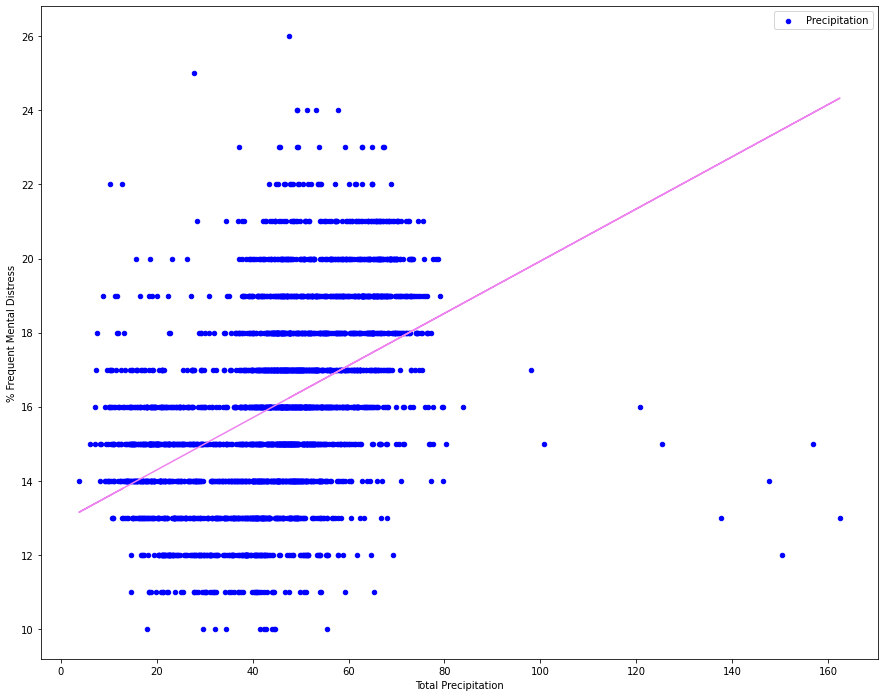

In [18]:
coefficients1 = np.polyfit(all_df['Total Precipitation'],all_df['% Frequent Mental Distress'],1)
polynomial1 = np.poly1d(coefficients1)

##Scatterplot
fig, ax = plt.subplots(figsize=(15, 12))
all_df.plot.scatter(y='% Frequent Mental Distress', x='Total Precipitation', c='blue',label='Precipitation', ax=ax)
plt.plot(all_df['Total Precipitation'], polynomial1(all_df['Total Precipitation']), color='violet')


plt.legend()
plt.show()

When looking at this visual we can see a slight association with higher precipitation and % Frequent Mental Distress.

The line of best fit shows that as total precipitation increases, mental distress also increases.

### % Frequent Mental Distress vs Average Temparature





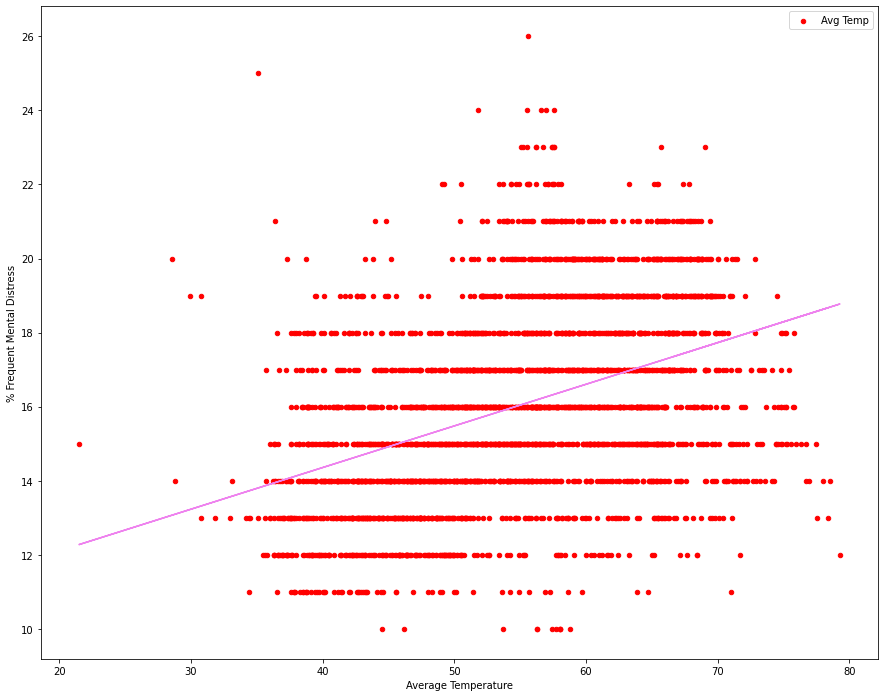

In [19]:
coefficients = np.polyfit(all_df['Average Temperature'],all_df['% Frequent Mental Distress'],1)
polynomial = np.poly1d(coefficients)

## Scatterplot
fig, ax = plt.subplots(figsize=(15, 12))
all_df.plot.scatter(y='% Frequent Mental Distress', x='Average Temperature', c='red',label='Avg Temp', ax=ax)
plt.plot(all_df['Average Temperature'], polynomial(all_df['Average Temperature']), color='violet')

plt.legend()
plt.show()

For our second scatterplot we notice that% Frequent Mental Distress varies over all temperatures.

The line of best fit shows as average temperature increases, percentage of frequent mental distress also increases.


### **Maps**

###Average Temperature

In [25]:
fig = px.choropleth(all_df, geojson=counties, locations='FIPS', color='Average Temperature',
                           color_continuous_scale="icefire",
                           range_color=(25, 75),
                           scope="usa"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

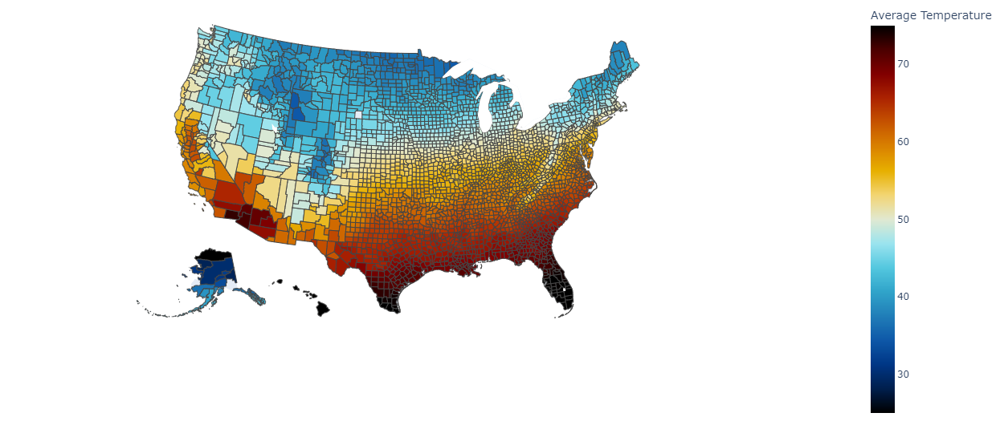

###Percent experiencing frequent mental distress

In [26]:
fig = px.choropleth(all_df, geojson=counties, locations='FIPS', color='% Frequent Mental Distress',
                           color_continuous_scale="Viridis",
                           range_color=(13, 21),
                           scope="usa"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

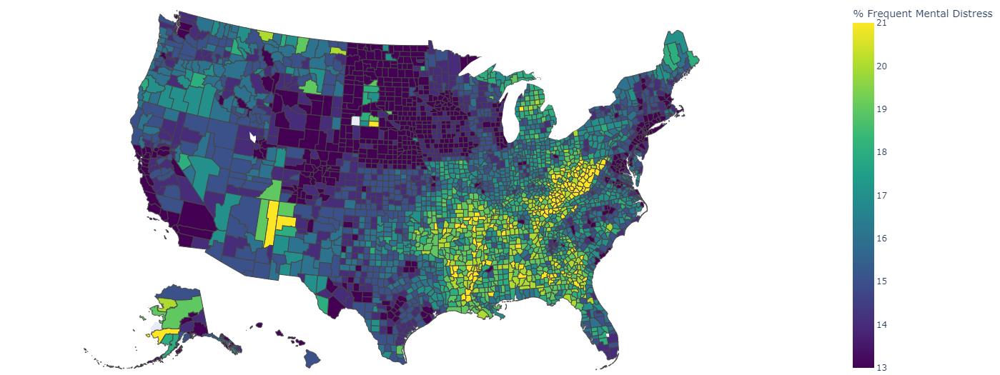

###Total Precipitation

In [27]:
fig = px.choropleth(all_df, geojson=counties, locations='FIPS', color='Total Precipitation',
                           color_continuous_scale="dense",
                           range_color=(8, 80),
                           scope="usa"
                          )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

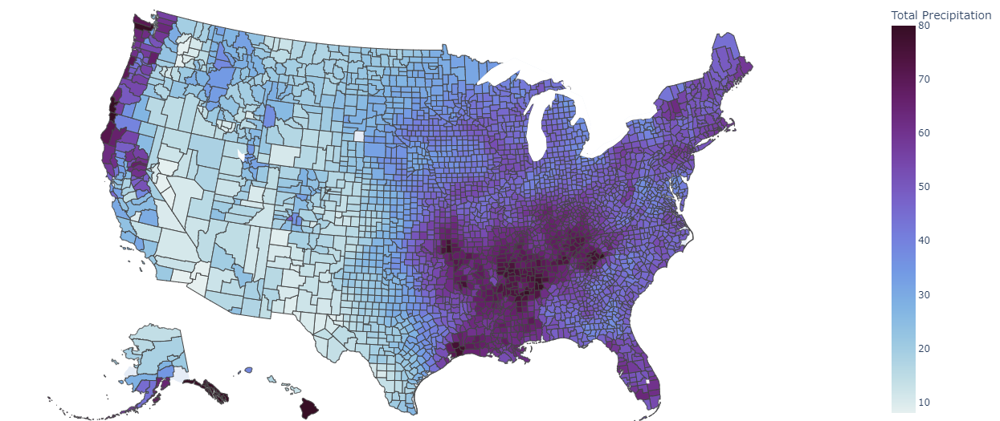

## **Statistical Significance**

#### Correlation Test: Total Precipitation and Mental Distress

In [29]:
pearsonr(all_df['% Frequent Mental Distress'],all_df['Total Precipitation'])

PearsonRResult(statistic=0.44369413147873293, pvalue=1.6404396502704386e-151)

The correlation statistic between percentage frequent mental distress and total precipitation is .44. This is considered a moderate positive association. As total precipitation increases, percentage frequent mental distress is expected to increase as well. The p-value is below 0.05, therefore we can assume a statistically significant association between these variables. 

#### Correlation Test: Average Temperature and Mental Distress

In [30]:
pearsonr(all_df['% Frequent Mental Distress'],all_df['Average Temperature'])

PearsonRResult(statistic=0.40878369629295425, pvalue=1.0660654887080833e-126)

The correlation statistic between percentage frequent mental distress and average temperature is .41. This is considered a moderate positive association. As average temperature increases, percentage frequent mental distress is expected to increase as well. The p-value is below 0.05, therefore we can assume a statistically significant association between these variables.

##**Investigating Outliers**

#### Higest frequency of mental distress

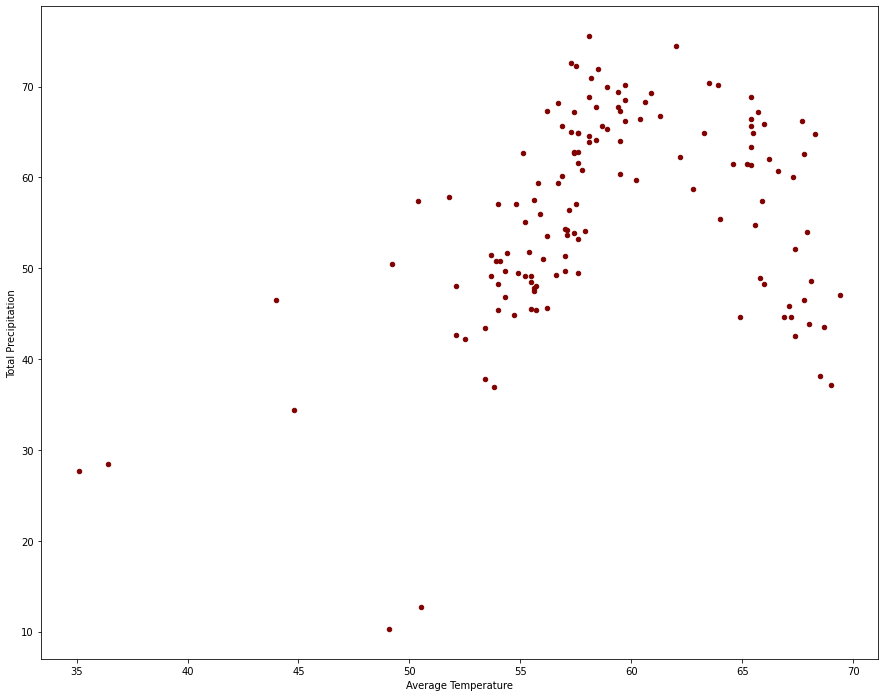

In [88]:
highest_md = all_df[all_df["% Frequent Mental Distress"] >= 21]

highest_md

## Scatterplot
fig, ax = plt.subplots(figsize=(15, 12))
highest_md.plot.scatter(y='Total Precipitation', x='Average Temperature', c='maroon', ax=ax)

plt.show()

#### Lowest Frequency of Mental Distress

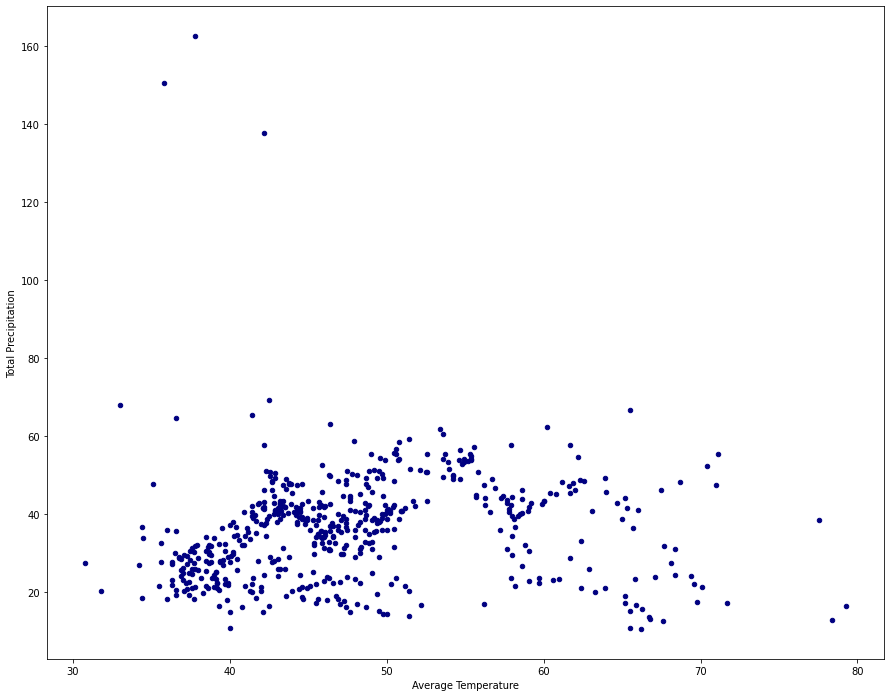

In [87]:
lowest_md = all_df[all_df["% Frequent Mental Distress"] <= 13]

lowest_md

## Scatterplot
fig, ax = plt.subplots(figsize=(15, 12))
lowest_md.plot.scatter(y='Total Precipitation', x='Average Temperature', c='navy', ax=ax)

plt.show()

Below are summary statistics for percentage experiencing frequent mental distress, total precipitation, and average temperature to reference when comparing to high and low values. 

#### Highest percentage of frequent mental distress: **West Virginia**

In [32]:
#most frequent mental distress

mh_df_descending = all_df.sort_values("% Frequent Mental Distress", ascending=False)

desc= mh_df_descending[["County","State", "% Frequent Mental Distress", "Total Precipitation", "Average Temperature"]]

# top 10
print(desc.head(10))

                    County State  % Frequent Mental Distress  \
3015       McDowell County    WV                          26   
81    Kusilvak Census Area    AK                          25   
3042        Webster County    WV                          24   
3046        Wyoming County    WV                          24   
3021          Mingo County    WV                          24   
2994          Boone County    WV                          24   
3014          Logan County    WV                          24   
2998        Calhoun County    WV                          23   
3041          Wayne County    WV                          23   
1018           Clay County    KY                          23   

      Total Precipitation  Average Temperature  
3015                47.54                 55.6  
81                  27.72                 35.1  
3042                57.80                 51.8  
3046                49.18                 55.5  
3021                53.19                 57.6  
2

West Virginia makes up 8 of the top 10 counties with highest percentage of frequent mental distress.

##Investigating West Virginia

We noticed that a majority of West Virginia counties had the highest percentage when it came to Frequent Mental Distress and wanted to take a look at the state as a whole. Noticing that West Virginia slightly supports our hypothesis with about average tempature and some high averages for precipition.  When looking at other outside sources and factors we found that West Virginia was ranked last 10 years in a row when it came to the Hapiness score for states.  These variables included Work Environment, Emotional & Physical Wellbeing, and Community/Environment.  
* Happiness Scores
https://wallethub.com/edu/happiest-states/6959

note: West Virginia also scored 50th(last) when it came to share of adult depression & adequate sleep rate.


In [76]:
from ipywidgets import widget_bool
#mh_df_descending = all_df.sort_values("% Frequent Mental Distress",'State'=='WV', ascending=False)

west_virginia = all_df[all_df["State"] == "WV"]

wv_descending = west_virginia.sort_values("% Frequent Mental Distress", ascending=False)

# top 10
wv_descending.head(10)

,FIPS,County,State,% Frequent Mental Distress,Total Precipitation,Average Temperature
3015,54047,McDowell County,WV,26,47.54,55.6
3046,54109,Wyoming County,WV,24,49.18,55.5
2994,54005,Boone County,WV,24,49.30,56.6
3014,54045,Logan County,WV,24,51.33,57.0
3042,54101,Webster County,WV,24,57.80,51.8
3021,54059,Mingo County,WV,24,53.19,57.6
3041,54099,Wayne County,WV,23,53.84,57.4
3013,54043,Lincoln County,WV,23,49.53,57.6
2999,54015,Clay County,WV,23,45.60,56.2
2998,54013,Calhoun County,WV,23,45.49,55.5


##**Conclusion**

Ultimately, we determined that there is a moderate positive association between weather and mental health. Total precipitation had a slightly stronger relationship with mental health than average temperature. As both of these weather measures increase in each county, the percentage of people in that county that experience frequent mental distress also increases. 

We hypothesized counties with higher total precipitation would also have higher mental distress, which was supported in our analysis. However, our analysis also showed that counties with higher average temperature also have higher mental distress, which disproved the second part of our hypothesis.

Although these associations are statistically significant, which supports our initial hypothesis, they are not a very strong relationships. We believe there are many other factors that may have a relationship with mental distress in addition to weather because this is a very complex topic. 